#### Having mostly worked with time series data (weather and stock realted) , the first thing that came to my mind when I explored the dataset was to do a time frequency analysis

In [1]:
import pandas as pd
import datetime as dt
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster

In [2]:
df = pd.read_csv('data.csv')

Text(0.5, 1.0, 'frequncy w.r.t. days of the week ')

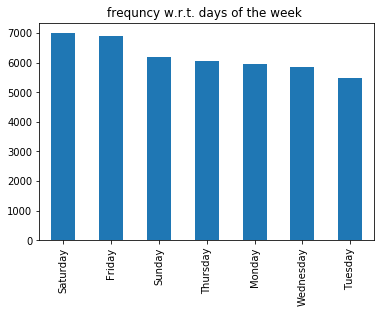

In [3]:
df.from_date = pd.to_datetime(df.from_date)
df['week'] = df.from_date.dt.weekday
df['week'] = df.week.replace([0, 1, 2, 3, 4, 5, 6], ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
pd.value_counts(df.week).plot(kind = 'bar').set_title('frequncy w.r.t. days of the week ')

###### As can be seen from the above graph, most of the clients rides started on weekend. This could be due to the fact that most of the clients from the given in the sample data sets, needed to travel for some leisure activity during the weekend (eg: a club, restaurant, movie etc). Therfore to cater to high demand on weekends, prices could be hiked on weekends ensuring more drivers are available on weekends , so as to take advantage of the high prices. High prices also ensure there is no surge in cab requests.

Text(0.5, 1.0, 'hourly frequency')

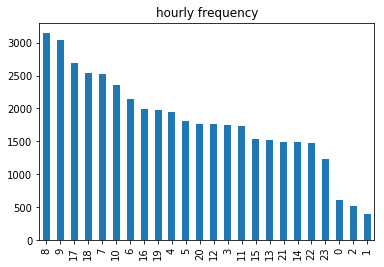

In [4]:
df['hour'] = df.from_date.dt.hour
pd.value_counts(df.hour).plot(kind='bar').set_title('hourly frequency')

######  Inspite there being high demands on weekends, the hourly analysis reveals that there is most demand during office going hours (office going time - 8, 9 & returning home time - 17, 18).

###### Therfore it is necessary to observe the graphs for each day to get a better understanding.

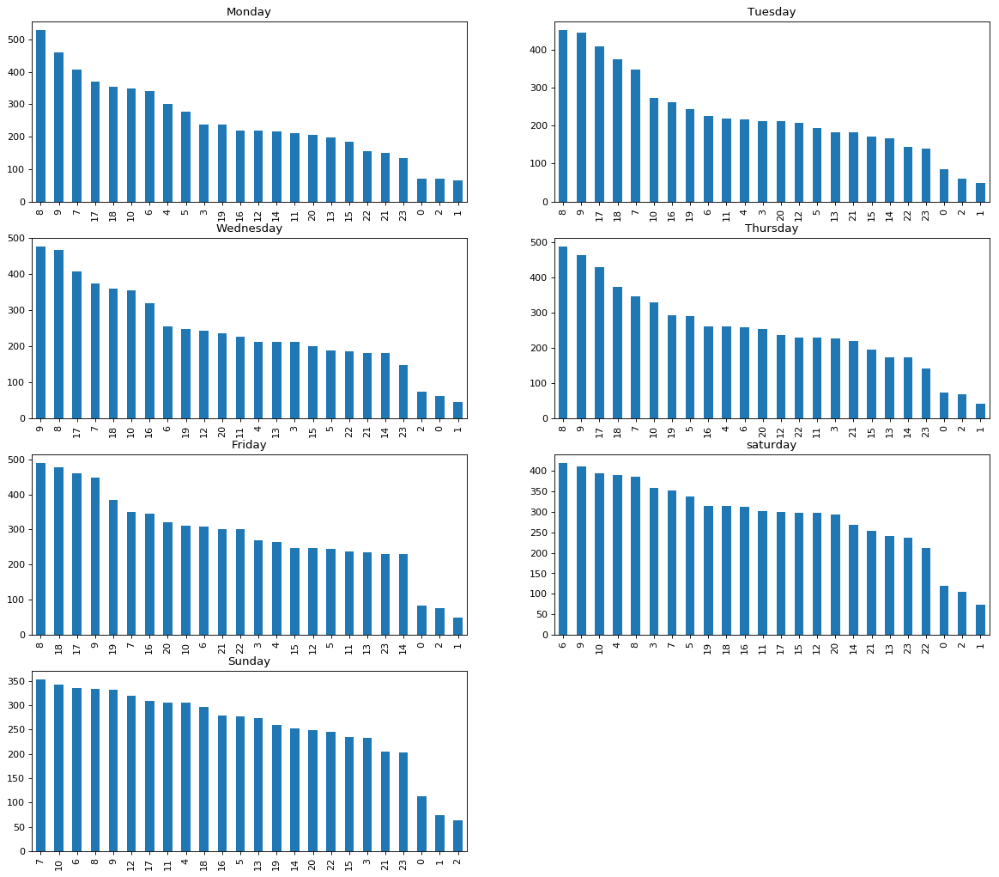

In [5]:
fig=plt.figure(figsize=(18, 16), dpi= 80, facecolor='w', edgecolor='k')
mon = pd.DataFrame
mon = df[df.values  == "Monday"]
plt.subplot(4, 2, 1).set_title('Monday')
pd.value_counts(mon.hour).plot(kind="bar")

tue = pd.DataFrame
tue = df[df.values  == "Tuesday"]
plt.subplot(4, 2, 2).set_title('Tuesday')
pd.value_counts(tue.hour).plot(kind="bar")

wed = pd.DataFrame
wed = df[df.values  == "Wednesday"]
plt.subplot(4, 2, 3).set_title('Wednesday')
pd.value_counts(wed.hour).plot(kind="bar")

thu = pd.DataFrame
thu = df[df.values  == "Thursday"]
plt.subplot(4, 2, 4).set_title('Thursday')
pd.value_counts(thu.hour).plot(kind="bar")

fri = pd.DataFrame
fri = df[df.values  == "Friday"]
plt.subplot(4, 2, 5).set_title('Friday')
pd.value_counts(fri.hour).plot(kind="bar")

sat = pd.DataFrame
sat = df[df.values  == "Saturday"]
plt.subplot(4, 2, 6).set_title('saturday')
pd.value_counts(sat.hour).plot(kind="bar")

sun = pd.DataFrame
sun = df[df.values  == "Sunday"]
plt.subplot(4, 2, 7).set_title('Sunday')
pd.value_counts(sun.hour).plot(kind="bar")

plt.show()





###### Taking a closer look at the frequency of rides at different days of the week, it can be inferred that the distribution is similiar for weekdays (office days) with only subtle differences.Inspite being weekend days , highest demand was on the office to and fro comute period



##### Weekends are also similiar but there are a few differences : 

###### comparitively not many rides are booked for time between midnight and 2 am

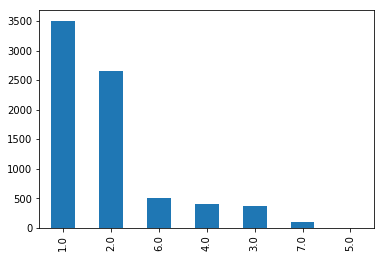

In [6]:
pd.value_counts(df.package_id).plot(kind="bar")

######  Majority of rides are within the 4hrs 40 km and 8 hrs 80 kms package. Therefore the radius of majority rides are within 40/80 kms radius. But it is interesting to note that there are virtually zero rides of 50kms 5 hours package.

#### However this column has a lot of missing data, can be mis interpretted.

##### Doubt: Online and mobile booking sometimes have the same value, is there a third method?

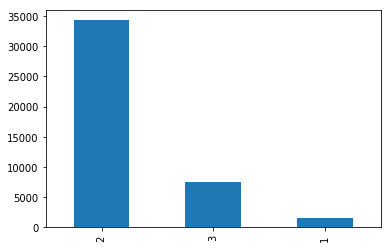

In [7]:
pd.value_counts(df.travel_type_id).plot(kind="bar")

In [8]:
df_loc = df.dropna(subset=['from_lat', 'from_long'])

In [9]:
mon_loc = mon.dropna(subset=['from_lat', 'from_long'])
tue_loc = tue.dropna(subset=['from_lat', 'from_long'])
wed_loc = wed.dropna(subset=['from_lat', 'from_long'])
thu_loc = thu.dropna(subset=['from_lat', 'from_long'])
fri_loc = fri.dropna(subset=['from_lat', 'from_long'])
sat_loc = sat.dropna(subset=['from_lat', 'from_long'])
sun_loc = sun.dropna(subset=['from_lat', 'from_long'])

## In the following maps, the numbers on the markers show the number of pickups in that area

#### Geo-spatial distribution for Monday

In [10]:
mon_map= folium.Map(location=[12.9716, 77.5946], zoom_start=12)
marker_cluster = MarkerCluster().add_to(mon_map)

for index, rows in mon_loc.iterrows():
    folium.Marker(location = [rows.from_lat, rows.from_long]).add_to(marker_cluster)

mon_map


#### Geo-spatial distribution for Tuesday

In [11]:
tue_map= folium.Map(location=[12.9716, 77.5946], zoom_start=12)
marker_cluster = MarkerCluster().add_to(tue_map)

for index, rows in tue_loc.iterrows():
    folium.Marker(location = [rows.from_lat, rows.from_long]).add_to(marker_cluster)

tue_map


#### Geo-spatial distribution for Wednesday

In [12]:
wed_map= folium.Map(location=[12.9716, 77.5946], zoom_start=12)
marker_cluster = MarkerCluster().add_to(wed_map)

for index, rows in wed_loc.iterrows():
    folium.Marker(location = [rows.from_lat, rows.from_long]).add_to(marker_cluster)

wed_map

#### Geo-spatial distribution for Thursday

In [13]:
thu_map= folium.Map(location=[12.9716, 77.5946], zoom_start=12)
marker_cluster = MarkerCluster().add_to(thu_map)

for index, rows in thu_loc.iterrows():
    folium.Marker(location = [rows.from_lat, rows.from_long]).add_to(marker_cluster)

thu_map

#### Geo-spatial distribution for Friday

In [14]:
fri_map= folium.Map(location=[12.9716, 77.5946], zoom_start=12)
marker_cluster = MarkerCluster().add_to(fri_map)

for index, rows in fri_loc.iterrows():
    folium.Marker(location = [rows.from_lat, rows.from_long]).add_to(marker_cluster)

fri_map

#### Geo-spatial distribution for Saturday

In [15]:
sat_map= folium.Map(location=[12.9716, 77.5946], zoom_start=12)
marker_cluster = MarkerCluster().add_to(sat_map)

for index, rows in sat_loc.iterrows():
    folium.Marker(location = [rows.from_lat, rows.from_long]).add_to(marker_cluster)

sat_map

#### Geo-spatial distribution for Sunday

In [16]:
sun_map= folium.Map(location=[12.9716, 77.5946], zoom_start=12)
marker_cluster = MarkerCluster().add_to(sun_map)

for index, rows in sun_loc.iterrows():
    folium.Marker(location = [rows.from_lat, rows.from_long]).add_to(marker_cluster)

sun_map

# Conclusions from this notebook:
### - Most demand is during weekends.
### - Most demand is during office to and fro commute period, least after midnight (midnight to 2 am).
###  -Most type of travel is point to point, least is rental

### Therfore cab utility can be maximised by:
### - hiking prices during office commute period, at areas having maximum pickups.
### - getting more cabs to do point to point and less on rental



# To Do Next:

## -Add a time dimension to the maps to check exact hour range within the area for which demand is maximum

## -Construct a predictive model given other data , to predict demand.